In [69]:
import librosa
import os
import warnings
import numpy as np
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Flatten, Conv1D, MaxPooling1D

In [43]:
!pip install --upgrade librosa



[notice] A new release of pip is available: 23.3.2 -> 24.0
[notice] To update, run: pip install --upgrade pip


In [103]:

# Define folder path containing audio files
folder_path = "/Users/admin/Documents/nlp-tutorials/dataset/audio_files"

# List all files in the folder
all_files = os.listdir(folder_path)

# Filter for WAV files only
wav_files = [f for f in all_files if f.endswith(".wav")]


def process_audio(audio_path):
    """
    Processes an audio file and extracts MFCCs.

    Args:
        audio_path (str): Path to the audio file.

    Returns:
        np.ndarray: Extracted MFCCs (or None if file not found).
    """

    try:
        # Suppress future warning about deprecated loading function (optional)
        warnings.filterwarnings("ignore", category=FutureWarning)
        y, sr = librosa.load(audio_path)
        mfccs = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=20)  # Extract 20 MFCCs by default
        return mfccs
    except FileNotFoundError:
        print(f"File not found: {audio_path}")
        return None  # Or handle missing files differently


def pad_mfccs(mfccs, max_length):
    """
    Pads MFCCs to a fixed length using constant padding.

    Args:
        mfccs (np.ndarray): MFCCs to be padded.
        max_length (int): Maximum desired length for MFCCs.

    Returns:
        np.ndarray: Padded MFCCs.
    """

    padded_mfccs = np.pad(mfccs, (0, max_length - mfccs.shape[0]), mode='constant')
    return padded_mfccs


def get_label(wav_file):
    """
    Assigns a label (0 for non-hate speech, 1 for hate speech) to an audio file.

    **Important:** Modify this function based on your specific data labeling scheme.

    Args:
        wav_file (str): Name of the audio file.

    Returns:
        int: Label (0 or 1) for the audio file.
    """

    # Example 1: Labels embedded in filenames (modify for your data)
    if wav_file.startswith("hate_speech"):
        return 1
    else:
        return 0

    # Example 2: Labels in a separate metadata file (implement logic to read from metadata)
    # ...

    # Or, if labels are manually provided in a separate file:
    # label_map = ...  # Assuming you have a dictionary mapping filenames to labels (0 or 1)
    # if wav_file in label_map:
    #     return label_map[wav_file]
    # else:
    #     print(f"Warning: Label not found for file: {wav_file}")
    #     return None  # Or handle missing files differently


# Process each WAV file, extract features, handle inconsistencies, and create lists
features = []
max_length = 0  # Initialize to track the maximum length of features
for wav_file in wav_files:
    full_path = os.path.join(folder_path, wav_file)
    processed_data = process_audio(full_path)

    if processed_data is not None:
        # **Inconsistency Check (Print shape for investigation)**
        print(f"Feature shape before padding: {processed_data.shape}")

        # Update max_length if current features have a longer sequence
        max_length = max(max_length, processed_data.shape[0])
        features.append(processed_data)

        label = get_label(wav_file)
        labels.append(label)

# Pad all features to the maximum length for consistent shape
padded_features = [pad_mfccs(mfccs, max_length) for mfccs in features]
features = np.array(padded_features)

# Ensure features and labels have the same length after processing
if len(features) != len(labels):
    print("Warning: Inconsistent number of features and labels. Check processing or labeling logic.")

# Model Training (Initial Steps


Feature shape before padding: (20, 862)
Feature shape before padding: (20, 862)
Feature shape before padding: (20, 862)
Feature shape before padding: (20, 862)
Feature shape before padding: (20, 862)
Feature shape before padding: (20, 862)
Feature shape before padding: (20, 862)
Feature shape before padding: (20, 862)
Feature shape before padding: (20, 862)
Feature shape before padding: (20, 862)
Feature shape before padding: (20, 856)
Feature shape before padding: (20, 862)
Feature shape before padding: (20, 862)
Feature shape before padding: (20, 862)
Feature shape before padding: (20, 862)
Feature shape before padding: (20, 862)
Feature shape before padding: (20, 862)
Feature shape before padding: (20, 862)
Feature shape before padding: (20, 862)
Feature shape before padding: (20, 853)
Feature shape before padding: (20, 800)
Feature shape before padding: (20, 862)
Feature shape before padding: (20, 862)
Feature shape before padding: (20, 856)
Feature shape before padding: (20, 862)


ValueError: setting an array element with a sequence. The requested array has an inhomogeneous shape after 2 dimensions. The detected shape was (139, 20) + inhomogeneous part.

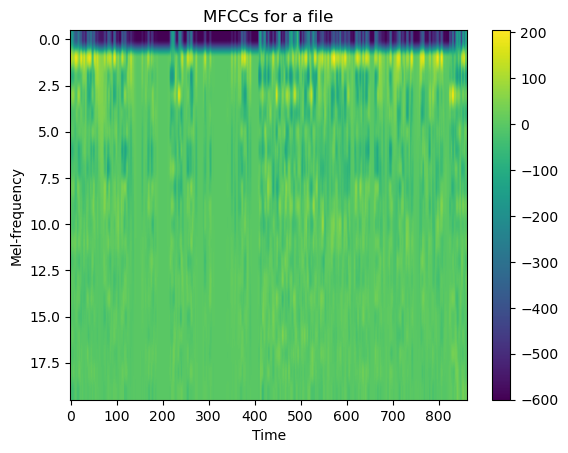

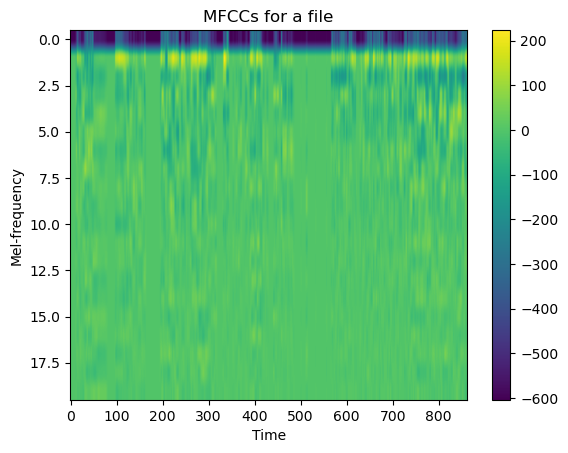

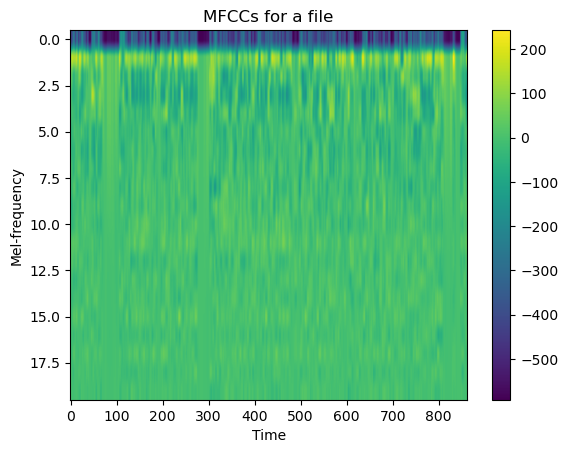

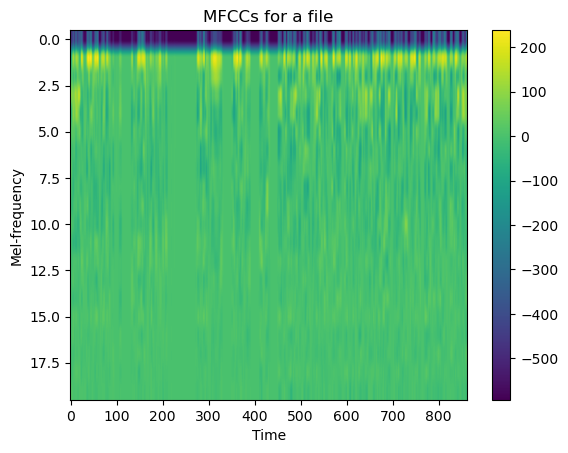

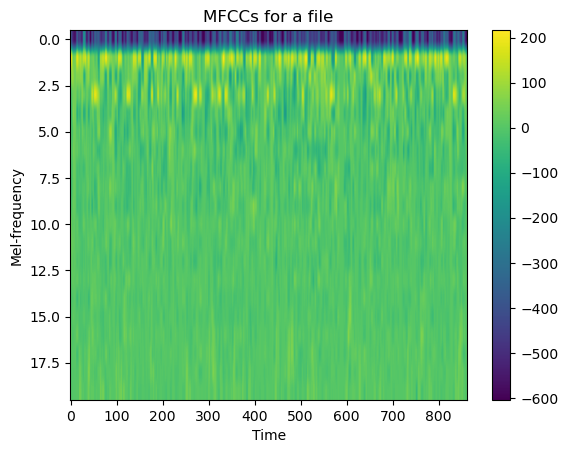

...

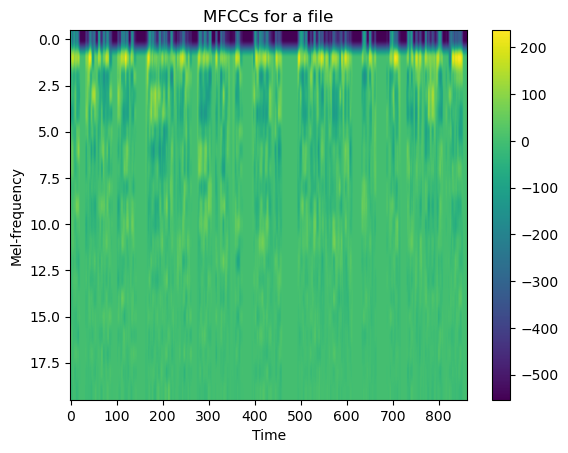

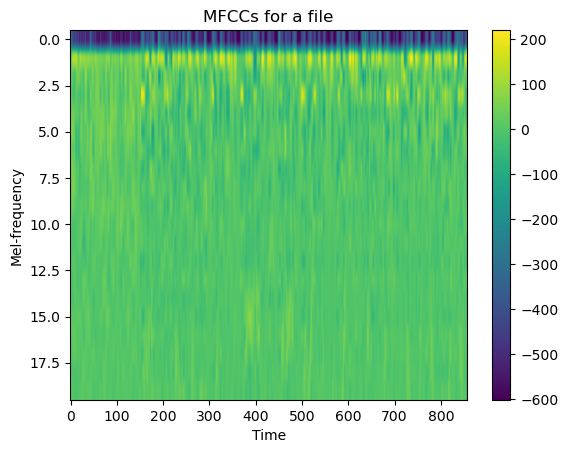

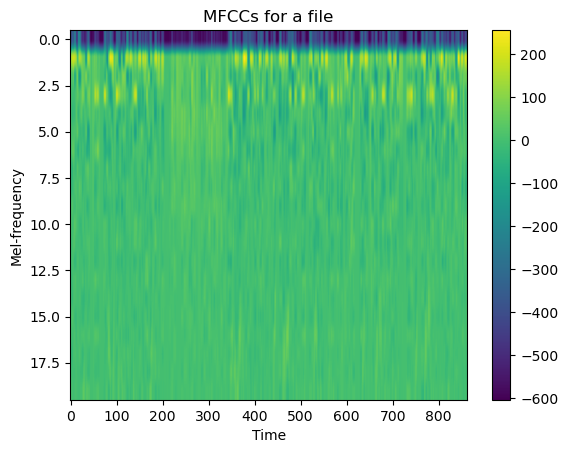

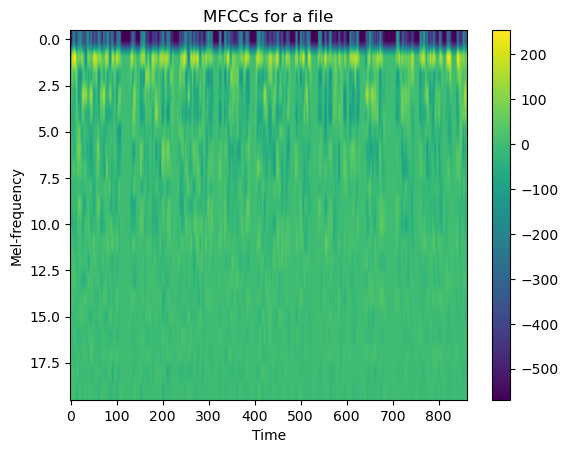

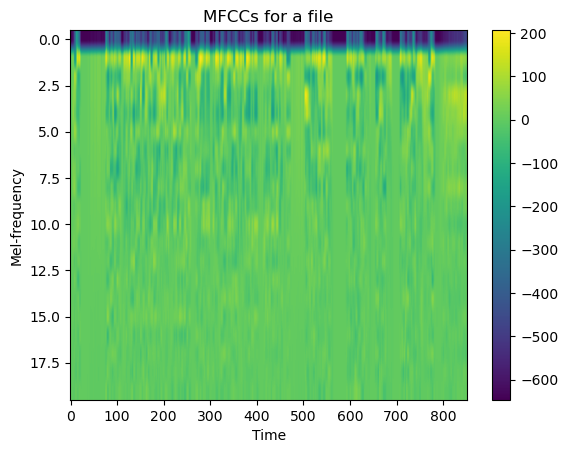

In [84]:
import matplotlib.pyplot as plt

for mfccs in processed_data_list:
    plt.figure()  # Create a new figure for each MFCC
    plt.imshow(mfccs, aspect='auto')  # Plot MFCCs as a heatmap
    plt.xlabel("Time")
    plt.ylabel("Mel-frequency")
    plt.title("MFCCs for a file")
    plt.colorbar()
    plt.show()

In [97]:
for i, mfccs in enumerate(features):
    print(f"Feature {i+1} shape: {mfccs.shape}")

Feature 1 shape: (20, 862)
Feature 2 shape: (20, 862)
Feature 3 shape: (20, 862)
Feature 4 shape: (20, 862)
Feature 5 shape: (20, 862)
Feature 6 shape: (20, 862)
Feature 7 shape: (20, 862)
Feature 8 shape: (20, 862)
Feature 9 shape: (20, 862)
Feature 10 shape: (20, 862)
Feature 11 shape: (20, 856)
Feature 12 shape: (20, 862)
Feature 13 shape: (20, 862)
Feature 14 shape: (20, 862)
Feature 15 shape: (20, 862)
Feature 16 shape: (20, 862)
Feature 17 shape: (20, 862)
Feature 18 shape: (20, 862)
Feature 19 shape: (20, 862)
Feature 20 shape: (20, 853)
Feature 21 shape: (20, 800)
Feature 22 shape: (20, 862)
Feature 23 shape: (20, 862)
Feature 24 shape: (20, 856)
Feature 25 shape: (20, 862)
Feature 26 shape: (20, 862)
Feature 27 shape: (20, 862)
Feature 28 shape: (20, 862)
Feature 29 shape: (20, 856)
Feature 30 shape: (20, 862)
Feature 31 shape: (20, 862)
Feature 32 shape: (20, 862)
Feature 33 shape: (20, 862)
Feature 34 shape: (20, 862)
Feature 35 shape: (20, 862)
Feature 36 shape: (20, 862)
F

In [99]:
for mfccs in features:
    print(mfccs.shape)

(20, 862)
(20, 862)
(20, 862)
(20, 862)
(20, 862)
(20, 862)
(20, 862)
(20, 862)
(20, 862)
(20, 862)
(20, 856)
(20, 862)
(20, 862)
(20, 862)
(20, 862)
(20, 862)
(20, 862)
(20, 862)
(20, 862)
(20, 853)
(20, 800)
(20, 862)
(20, 862)
(20, 856)
(20, 862)
(20, 862)
(20, 862)
(20, 862)
(20, 856)
(20, 862)
(20, 862)
(20, 862)
(20, 862)
(20, 862)
(20, 862)
(20, 862)
(20, 862)
(20, 857)
(20, 862)
(20, 862)
(20, 862)
(20, 862)
(20, 862)
(20, 862)
(20, 862)
(20, 862)
(20, 862)
(20, 862)
(20, 862)
(20, 862)
(20, 862)
(20, 862)
(20, 862)
(20, 862)
(20, 857)
(20, 862)
(20, 862)
(20, 862)
(20, 862)
(20, 862)
(20, 862)
(20, 862)
(20, 862)
(20, 862)
(20, 862)
(20, 862)
(20, 862)
(20, 862)
(20, 862)
(20, 862)
(20, 862)
(20, 855)
(20, 862)
(20, 862)
(20, 856)
(20, 862)
(20, 862)
(20, 862)
(20, 862)
(20, 862)
(20, 862)
(20, 862)
(20, 856)
(20, 862)
(20, 862)
(20, 862)
(20, 857)
(20, 852)
(20, 852)
(20, 862)
(20, 862)
(20, 862)
(20, 862)
(20, 862)
(20, 862)
(20, 862)
(20, 862)
(20, 862)
(20, 862)
(20, 855)


In [104]:
features = np.array(features)

ValueError: setting an array element with a sequence. The requested array has an inhomogeneous shape after 2 dimensions. The detected shape was (139, 20) + inhomogeneous part.

In [94]:
model = Sequential()
model.add(Conv1D(filters=32, kernel_size=3, activation='relu', input_shape=(features.shape[1], features.shape[2])))
model.add(MaxPooling1D(pool_size=2))
model.add(Flatten())
model.add(Dense(128, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(1, activation='sigmoid'))  # Output layer for binary classification (hate speech or not)

AttributeError: 'list' object has no attribute 'shape'